In [1]:
from pathlib import Path
import sys

# Raíz del repo y carpetas
ROOT = Path.cwd().parents[0] if (Path.cwd().name == "notebooks") else Path.cwd()
if str(ROOT) not in sys.path:
    sys.path.append(str(ROOT))

OUT = ROOT / "outputs"
SUMMARY = OUT / "summary"
SUMMARY.mkdir(parents=True, exist_ok=True)

print("ROOT   :", ROOT)
print("OUT    :", OUT)
print("SUMMARY:", SUMMARY)


ROOT   : /home/cesar/proyectos/TFM_SNN
OUT    : /home/cesar/proyectos/TFM_SNN/outputs
SUMMARY: /home/cesar/proyectos/TFM_SNN/outputs/summary


In [2]:
import os, re, json, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path

# ====== Importa utilidades ======
from src.results_io import build_results_table
# plots opcionales; si no están, seguimos sin ellos
try:
    from src.plots import plot_across_runs, plot_mae_curves_for_run as plot_loss_curves_for_run, export_leaderboards
except Exception:
    plot_across_runs = None
    plot_loss_curves_for_run = None
    export_leaderboards = None

# ====== Normalizador de nombres de método ======
def canonical_method(s: str) -> str:
    if not isinstance(s, str):
        return "unknown"
    t = s.lower()
    # combinaciones primero
    if ("rehearsal" in t) and ("+ewc" in t or "_ewc" in t):
        return "rehearsal+ewc"
    # familias específicas SNN
    if "sca-snn" in t: return "sca-snn"
    if re.search(r"\bsa[-_]snn\b", t): return "sa-snn"
    if re.search(r"\bas[-_]snn\b", t): return "as-snn"
    if "colanet" in t: return "colanet"
    # genéricos
    if re.search(r"\bewc\b", t) or "ewc_lam" in t: return "ewc"
    if "rehearsal" in t: return "rehearsal"
    if "naive" in t or "finetune" in t or "fine-tune" in t: return "naive"
    # fallback
    return t.split("_")[0]

# ====== Normalizadores numéricos ======
def minmax(series: pd.Series) -> pd.Series:
    s = pd.to_numeric(series, errors="coerce")
    lo, hi = s.min(skipna=True), s.max(skipna=True)
    if pd.isna(lo) or pd.isna(hi) or lo == hi:
        return pd.Series(np.where(s.notna(), 0.0, np.nan), index=s.index)
    return (s - lo) / (hi - lo)

def norm01(x: np.ndarray) -> np.ndarray:
    # versión robusta a arrays vacíos
    x = np.asarray(x, dtype=float)
    if x.size == 0:
        return x
    lo, hi = np.nanmin(x), np.nanmax(x)
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        return np.full_like(x, 0.5)
    return (x - lo) / (hi - lo)

# ====== Helpers de paths y detección de “runner nuevo” ======
def _abs_run_dir(run_dir: str|Path) -> Path:
    p = Path(run_dir)
    return p if p.is_absolute() else (OUT / p)

def is_new_runner(run_dir: str|Path) -> bool:
    """Runner NUEVO ⇢ presencia de run_row.json o run_row.csv en la raíz del run."""
    p = _abs_run_dir(run_dir)
    return (p / "run_row.json").exists() or (p / "run_row.csv").exists()

def run_mtime(run_dir: str|Path) -> float:
    """Marca de tiempo (máx mtime de carpeta y su primer nivel)."""
    p = _abs_run_dir(run_dir)
    try:
        mt = [p.stat().st_mtime]
        for c in p.iterdir():
            try:
                mt.append(c.stat().st_mtime)
            except Exception:
                pass
        return max(mt)
    except Exception:
        return 0.0

# ====== Lectura robusta de JSON y backfill de batch_size ======
def _safe_json_load(p: Path) -> dict:
    try:
        if Path(p).exists():
            return json.loads(Path(p).read_text(encoding="utf-8"))
    except Exception:
        pass
    return {}

def _deep_find_first_int(d: dict, key_substrs=("batch", "size")) -> int | None:
    """Busca recursivamente un entero en cualquier clave que contenga ambas substrings (p.ej. 'batch_size')."""
    try:
        from collections.abc import Mapping
        def ok_key(k):
            if not isinstance(k, str):
                return False
            t = k.lower()
            return all(s in t for s in key_substrs)
        def walk(x):
            if isinstance(x, Mapping):
                for k,v in x.items():
                    if ok_key(k):
                        try:
                            val = int(v)
                            return val
                        except Exception:
                            pass
                    r = walk(v)
                    if r is not None:
                        return r
            elif isinstance(x, (list, tuple)):
                for it in x:
                    r = walk(it)
                    if r is not None:
                        return r
            return None
        return walk(d)
    except Exception:
        return None

def backfill_batch_size(df: pd.DataFrame) -> pd.DataFrame:
    """Rellena df['batch_size'] leyendo manifests de tareas y run_row.json (incluye búsqueda anidada)."""
    if "run_dir" not in df.columns:
        return df
    vals = []
    for run_dir in df["run_dir"]:
        rd = _abs_run_dir(run_dir)
        b = None

        # 1) manifests por tarea
        for td in sorted(rd.glob("task_*")):
            man = _safe_json_load(td / "manifest.json")
            meta = man.get("meta", {}) if isinstance(man, dict) else {}
            b = meta.get("batch_size")
            if b is None:
                # por si vino con otro nombre o anidado
                b = _deep_find_first_int(meta, key_substrs=("batch","size"))
            if b is not None:
                break

        # 2) run_row.json (top-level o anidado, ej. optim.batch_size)
        if b is None:
            rr = _safe_json_load(rd / "run_row.json")
            if rr:
                b = rr.get("batch_size")
                if b is None:
                    # intenta rutas frecuentes
                    try:
                        b = rr.get("optim", {}).get("batch_size", None)
                    except Exception:
                        pass
                if b is None:
                    b = _deep_find_first_int(rr, key_substrs=("batch","size"))

        try:
            b = int(b) if b is not None else np.nan
        except Exception:
            b = np.nan
        vals.append(b)

    out = df.copy()
    out["batch_size"] = pd.to_numeric(pd.Series(vals, index=df.index), errors="coerce")
    return out



In [3]:
# Reconstruye la tabla si hay runs más recientes que el CSV
tbl_path = SUMMARY / "results_table.csv"

def _needs_rebuild():
    if not tbl_path.exists():
        return True
    csv_mtime = tbl_path.stat().st_mtime
    runs = [p for p in OUT.glob("continual_*") if p.is_dir()]
    return any(p.stat().st_mtime > csv_mtime for p in runs)

if _needs_rebuild():
    df = build_results_table(OUT)
    # Señaliza “runner nuevo” por run_row.*
    df["is_new_runner"] = df["run_dir"].apply(is_new_runner)
    df.to_csv(tbl_path, index=False)
    print("[OK] Tabla reconstruida:", tbl_path, "| filas:", len(df))
else:
    df = pd.read_csv(tbl_path)
    if "is_new_runner" not in df.columns:
        df["is_new_runner"] = df["run_dir"].apply(is_new_runner)
    print("[INFO] Tabla cargada:", tbl_path, "| filas:", len(df))

display(df)

# (Opcional) métricas globales de cobertura
print("\nCobertura por preset:")
display(df["preset"].value_counts(dropna=False))
print("\nCobertura por método (crudo, sin normalizar):")
display(df["method"].value_counts(dropna=False))


[INFO] Tabla cargada: /home/cesar/proyectos/TFM_SNN/outputs/summary/results_table.csv | filas: 105


,run_dir,preset,method,encoder,model,seed,T,B,batch_size,amp,...,telemetry_emissions_kg,circuito1_best_mae,circuito1_final_mae,circuito1_forget_abs,circuito1_forget_rel,circuito2_best_mae,circuito2_final_mae,circuito2_forget_abs,circuito2_forget_rel,is_new_runner
0,continual_accurate_as-snn_gr_0.25_lam_1.2_att_...,accurate,as-snn_gr_0.25_lam_1.2_att_f6,rate,PilotNetSNN_66x200_gray,42,30.0,160.0,160.0,True,...,0.125019,0.170435,0.170508,0.000073,0.000430,0.222547,0.222547,0.0,0.0,True
1,continual_accurate_as-snn_gr_0.35_lam_1.8_att_...,accurate,as-snn_gr_0.35_lam_1.8_att_f6_scale_on,rate,PilotNetSNN_66x200_gray,42,30.0,160.0,160.0,True,...,0.125836,0.170476,0.170614,0.000138,0.000812,0.222610,0.222610,0.0,0.0,True
2,continual_accurate_as-snn_gr_0.3_lam_1.59168_r...,accurate,as-snn_gr_0.3_lam_1.59168,rate,PilotNetSNN_66x200_gray,42,30.0,32.0,32.0,True,...,0.065574,0.124857,0.158338,0.033481,0.268158,0.134521,0.134521,0.0,0.0,False
3,continual_accurate_as-snn_gr_0.3_lam_1.59168_a...,accurate,as-snn_gr_0.3_lam_1.59168_att_f6,rate,PilotNetSNN_66x200_gray,42,30.0,160.0,160.0,True,...,0.127996,0.123083,0.184996,0.061913,0.503015,0.152245,0.152245,0.0,0.0,True
4,continual_accurate_as-snn_gr_0.3_lam_1.59168_a...,accurate,as-snn_gr_0.3_lam_1.59168_att_f6_scale_on,rate,PilotNetSNN_66x200_gray,42,30.0,160.0,160.0,True,...,0.114858,0.170551,0.170551,0.000000,0.000000,0.222565,0.222565,0.0,0.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,continual_std_ewc_lam_7e+08_lam_7e+08_ewc_hpo_...,std,ewc_lam_7e+08_lam_7e+08_ewc_hpo_t2_lam_7.0e+08,rate,PilotNetSNN,42,NaN,96.0,96.0,False,...,NaN,0.140915,0.172076,0.031161,0.221133,0.201512,0.201512,0.0,0.0,False
101,continual_std_naive_rate_model-PilotNetSNN_66x...,std,naive,rate,PilotNetSNN,42,NaN,56.0,56.0,True,...,NaN,0.127417,0.163961,0.036545,0.286812,0.139246,0.139246,0.0,0.0,False
102,continual_std_rehearsal_buf_3000_rr_10_rate_mo...,std,rehearsal_buf_3000_rr_10,rate,PilotNetSNN,42,NaN,56.0,56.0,True,...,NaN,0.128092,0.151696,0.023604,0.184272,0.143461,0.143461,0.0,0.0,False
103,continual_std_rehearsal_buf_3000_rr_10+ewc_lam...,std,rehearsal_buf_3000_rr_10+ewc_lam_7e+08_lam_7e+08,rate,PilotNetSNN,42,NaN,56.0,56.0,True,...,NaN,0.125205,0.173030,0.047825,0.381972,0.229081,0.229081,0.0,0.0,False



Cobertura por preset:


preset
accurate    42
fast        35
std         28
Name: count, dtype: int64


Cobertura por método (crudo, sin normalizar):


method
as-snn_gr_0.3_lam_1.59168                         5
sa-snn                                            5
naive                                             5
ewc_lam_7e+08                                     4
rehearsal_buf_3000_rr_10                          4
                                                 ..
ewc_lam_4e+08_lam_4e+08_ewc_hpo_t3_lam_4.0e+08    1
ewc_lam_5e+07_lam_5e+07_ewc_hpo_t4_lam_5.0e+07    1
ewc_lam_7e+08_lam_7e+08                           1
ewc_lam_7e+08_lam_7e+08_ewc_hpo_t0_lam_7.0e+08    1
ewc_lam_7e+08_lam_7e+08_ewc_hpo_t2_lam_7.0e+08    1
Name: count, Length: 73, dtype: int64

In [4]:
# Celda 3A — Re-evaluación auto de runs con eval_matrix "vacía"
from pathlib import Path
import json, numpy as np
from src.runner import reevaluate_only  # requiere que ya pegaste la función en src/runner.py

ROOT = Path.cwd().parents[0] if (Path.cwd().name == "notebooks") else Path.cwd()
OUT = ROOT / "outputs"

def _needs_reeval(run_dir: Path) -> bool:
    jf = run_dir / "eval_matrix.json"
    if not jf.exists():
        # si no hay json pero sí continual_results.json, también reevalúo
        return (run_dir / "continual_results.json").exists()
    try:
        j = json.loads(jf.read_text(encoding="utf-8"))
        tasks = j.get("tasks") or []
        M     = j.get("mae_matrix") or []
        A = np.array(M, dtype=float)
        if A.ndim != 2 or A.shape[0] != len(tasks) or A.shape[1] == 0:
            return True
        last_col = A[:, -1]
        # “última columna todo NaN” => reevalúa
        return not np.isfinite(last_col).any()
    except Exception:
        return True

targets = []
for p in sorted(OUT.glob("continual_*")):
    if p.is_dir() and _needs_reeval(p):
        targets.append(p)

print(f"[INFO] Runs a reevaluar: {len(targets)}")
for rd in targets:
    print("  -", rd.name)
    reevaluate_only(rd, verbose=True)

print("[OK] Reevaluación terminada. Ahora relanza Celda 3–6.")


[INFO] Runs a reevaluar: 0
[OK] Reevaluación terminada. Ahora relanza Celda 3–6.


In [ ]:
# Celda 3B — Reevaluación manual de un run concreto (opcional)
from pathlib import Path
from src.runner import reevaluate_only

run_dir = Path("outputs/continual_accurate_sca-snn_bins50_beta0.6_bias0.05_temp0.5_ab16_flat0_best_sca_b060_bias005_t050_ab16_rate_model-PilotNetSNN_66x200_gray_seed_42")
reevaluate_from_results(run_dir, verbose=True)
print("[OK] Reevaluación manual terminada.")


NameError: name 'reevaluate_from_results' is not defined

In [5]:
# === CELDA 4 — PATCH: rellenar *_final_mae desde eval_matrix / per_task_perf ===
import json, numpy as np, pandas as pd
from pathlib import Path

def _abs_run_dir(run_dir: str | Path) -> Path:
    p = Path(run_dir)
    return p if p.is_absolute() else (OUT / p)

def _safe_json(p: Path) -> dict:
    try:
        if p.exists():
            return json.loads(p.read_text(encoding="utf-8"))
    except Exception:
        pass
    return {}

def _is_missing(v) -> bool:
    """True si el valor está ausente: None, NaN o cadena vacía/espacios."""
    if v is None:
        return True
    if isinstance(v, float):
        return np.isnan(v)
    if isinstance(v, str):
        return v.strip() == ""
    return False

def _fill_final_mae_from_eval_matrix(row: pd.Series, df_cols: list[str]) -> dict:
    """Intenta rellenar *_final_mae leyendo eval_matrix.json (o .csv si no hay json)."""
    updates = {}
    rd = _abs_run_dir(row["run_dir"])

    def _apply_from_tasks_and_M(tasks, M):
        out = {}
        if not tasks or not M:
            return out
        A = np.array(M, dtype=float)
        # Matriz cuadrada con tantas filas como tasks
        if A.ndim != 2 or A.shape[0] != len(tasks):
            return out
        if A.shape[1] < 1:
            return out
        final = A[:, -1]
        for tname, v in zip(tasks, final):
            col = f"{tname}_final_mae"
            if col in df_cols and _is_missing(row.get(col)) and np.isfinite(v):
                out[col] = float(v)
        return out

    # 1) JSON
    jpath = rd / "eval_matrix.json"
    if jpath.exists():
        j = _safe_json(jpath)
        up = _apply_from_tasks_and_M(j.get("tasks"), j.get("mae_matrix"))
        if up:
            updates.update(up)

    # 2) CSV (fallback)
    if not updates:
        cpath = rd / "eval_matrix.csv"
        if cpath.exists():
            try:
                dfm = pd.read_csv(cpath)
                if "task" in dfm.columns:
                    tasks = dfm["task"].astype(str).tolist()
                    cols = [c for c in dfm.columns if c != "task"]
                    M = (
                        dfm[cols]
                        .replace("", np.nan)
                        .apply(pd.to_numeric, errors="coerce")
                        .values
                        .tolist()
                    )
                    up = _apply_from_tasks_and_M(tasks, M)
                    if up:
                        updates.update(up)
            except Exception:
                pass

    return updates

def _fill_final_mae_from_per_task_perf(row: pd.Series, df_cols: list[str]) -> dict:
    """Intenta rellenar *_final_mae leyendo per_task_perf.json o per_task_perf.csv."""
    updates = {}
    rd = _abs_run_dir(row["run_dir"])

    # 1) JSON
    pj = rd / "per_task_perf.json"
    if pj.exists():
        try:
            P = json.loads(pj.read_text(encoding="utf-8"))
            items = []
            if isinstance(P, list):
                items = P
            elif isinstance(P, dict) and isinstance(P.get("rows"), list):
                items = P["rows"]
            for it in items:
                tname = str(it.get("task_name") or it.get("name") or it.get("task") or "").strip()
                if not tname:
                    continue
                col = f"{tname}_final_mae"
                if col in df_cols and _is_missing(row.get(col)):
                    for k in ("test_mae", "final_mae", "val_mae", "best_val_mae"):
                        v = it.get(k)
                        if v is not None:
                            try:
                                v = float(v)
                                if np.isfinite(v):
                                    updates[col] = v
                                    break
                            except Exception:
                                pass
        except Exception:
            pass

    # 2) CSV
    if not updates:
        pc = rd / "per_task_perf.csv"
        if pc.exists():
            try:
                P = pd.read_csv(pc)
                tcol = None
                for cand in ("task_name", "name", "task"):
                    if cand in P.columns:
                        tcol = cand
                        break
                if tcol is not None:
                    for _, r in P.iterrows():
                        tname = str(r.get(tcol) or "").strip()
                        if not tname:
                            continue
                        col = f"{tname}_final_mae"
                        if col in df_cols and _is_missing(row.get(col)):
                            for k in ("test_mae", "final_mae", "val_mae"):
                                if k in P.columns and pd.notna(r.get(k)):
                                    try:
                                        v = float(r[k])
                                        if np.isfinite(v):
                                            updates[col] = v
                                            break
                                    except Exception:
                                        pass
            except Exception:
                pass

    return updates

def patch_missing_final_mae(df_in: pd.DataFrame) -> pd.DataFrame:
    """Rellena en df las columnas *_final_mae ausentes usando ficheros del run."""
    df_out = df_in.copy()

    # Normaliza cadenas vacías a NaN para coherencia visual aguas abajo
    df_out.replace("", np.nan, inplace=True)

    mae_cols = [c for c in df_out.columns if c.endswith("_final_mae")]
    if not mae_cols:
        print("[PATCH] No hay columnas *_final_mae en la tabla.")
        return df_out

    def row_needs_patch(row: pd.Series) -> bool:
        return any(_is_missing(row.get(c)) for c in mae_cols)

    idxs = [i for i in df_out.index if row_needs_patch(df_out.loc[i])]
    patched_runs = []

    for i in idxs:
        row = df_out.loc[i]
        # 1) eval_matrix
        up = _fill_final_mae_from_eval_matrix(row, df_out.columns.tolist())
        # 2) per_task_perf (si eval_matrix no aportó nada)
        if not up:
            up = _fill_final_mae_from_per_task_perf(row, df_out.columns.tolist())
        if up:
            for k, v in up.items():
                df_out.at[i, k] = v
            patched_runs.append((row.get("run_dir", "<unknown>"), sorted(up.keys())))

    print(f"[PATCH] Rellenados *_final_mae en {len(patched_runs)} runs usando eval_matrix/per_task_perf")
    if patched_runs:
        for rd, cols in patched_runs:
            print("  -", rd, "→", ", ".join(cols))

    return df_out

# Ejecuta el patch sobre 'df' (de la celda 3)
df = patch_missing_final_mae(df)


[PATCH] Rellenados *_final_mae en 0 runs usando eval_matrix/per_task_perf


In [6]:
# =================== TOGGLES (ajusta si quieres) ===================
ONLY_NEW_RUNNER = True   # Solo runs con run_row.* (runner nuevo)
STRICT_CFG      = True   # Misma cfg para comparación justa
ONLY_AFTER_DATE = "2025-10-31 00:00"   # Ej. "2025-10-31 00:00" para corte temporal opcional
PRESET_SELECT   = "accurate"
# ===================================================================

# --- 1) Filtrar a preset seleccionado ---
df_acc = df[df["preset"] == PRESET_SELECT].copy()
if df_acc.empty:
    raise RuntimeError(f"No hay runs con preset='{PRESET_SELECT}' en la tabla.")

# --- 2) Filtros opcionales ---
if ONLY_NEW_RUNNER:
    df_acc = df_acc[df_acc["is_new_runner"] == True].copy()
    print("[INFO] Filtrado a runs del runner nuevo →", len(df_acc))

if ONLY_AFTER_DATE:
    ts = pd.Timestamp(ONLY_AFTER_DATE).timestamp()
    df_acc = df_acc[df_acc["run_dir"].apply(lambda r: run_mtime(r) >= ts)].copy()
    print(f"[INFO] Filtrado a runs con mtime ≥ {ONLY_AFTER_DATE} →", len(df_acc))

# backfill de batch_size desde manifests si faltaba
df_acc = backfill_batch_size(df_acc)

# Debug rápido: ver qué valores reales hay antes del filtro estricto
print("\n[DEBUG] Valores reales en", PRESET_SELECT, "+ runner nuevo (antes de STRICT_CFG)")
for col in ["encoder","T","batch_size","amp","model","seed"]:
    if col in df_acc.columns:
        print(f"  {col}:")
        if col in ("T","batch_size","seed"):
            display(pd.to_numeric(df_acc[col], errors="coerce").value_counts(dropna=False))
        else:
            display(df_acc[col].value_counts(dropna=False))

# --- 3) Filtro estricto pero robusto ---
if STRICT_CFG:
    for col in ["encoder","T","batch_size","amp","model","seed"]:
        if col not in df_acc.columns:
            df_acc[col] = np.nan

    want = {
        "encoder": "rate",
        "T": 30,
        "batch_size": 160,
        "amp": True,
        "model": "PilotNetSNN_66x200_gray",
        "seed": 42,
    }

    enc_ok  = (df_acc["encoder"] == want["encoder"])
    T_ok    = (pd.to_numeric(df_acc["T"], errors="coerce") == want["T"])
    amp_ok  = df_acc["amp"].astype(str).str.lower().isin(["true","1","yes"])
    model_ok= df_acc["model"].astype(str).str.contains(str(want["model"]), na=False)
    seed_ok = (pd.to_numeric(df_acc["seed"], errors="coerce") == want["seed"])

    # <- aquí el cambio clave: batch_size 160 o NaN (desconocido = no descartes)
    bs = pd.to_numeric(df_acc["batch_size"], errors="coerce")
    bs_ok = bs.eq(want["batch_size"]) | bs.isna()

    mask_cfg = enc_ok & T_ok & bs_ok & amp_ok & model_ok & seed_ok

    df_strict = df_acc[mask_cfg].copy()
    print("[INFO] Filtrado a runs comparables (cfg común, batch_size tolerante) →", len(df_strict))

    if df_strict.empty:
        # fallback AUTO (cfg mayoritaria) como ya tenías
        base = df_acc.copy()
        enc  = base["encoder"].mode(dropna=True)
        Tm   = pd.to_numeric(base["T"], errors="coerce").mode(dropna=True)
        Bm   = pd.to_numeric(base["batch_size"], errors="coerce").mode(dropna=True)
        ampm = base["amp"].astype(str).str.lower().mode(dropna=True)
        mod  = base["model"].mode(dropna=True)
        seed = pd.to_numeric(base["seed"], errors="coerce").mode(dropna=True)

        mask_auto = pd.Series(True, index=base.index)
        if not enc.empty:  mask_auto &= (base["encoder"] == enc.iloc[0])
        if not Tm.empty:   mask_auto &= (pd.to_numeric(base["T"], errors="coerce") == Tm.iloc[0])
        if not Bm.empty:   mask_auto &= (pd.to_numeric(base["batch_size"], errors="coerce") == Bm.iloc[0])
        if not ampm.empty: mask_auto &= base["amp"].astype(str).str.lower().eq(ampm.iloc[0])
        if not mod.empty:  mask_auto &= (base["model"] == mod.iloc[0])
        if not seed.empty: mask_auto &= (pd.to_numeric(base["seed"], errors="coerce") == seed.iloc[0])

        df_strict = base[mask_auto].copy()
        print("[WARN] STRICT_CFG vacío; aplicado modo AUTO (cfg mayoritaria) →", len(df_strict))
        print("       AUTO =", {
            "encoder": enc.iloc[0] if not enc.empty else None,
            "T":       Tm.iloc[0] if not Tm.empty else None,
            "batch":   Bm.iloc[0] if not Bm.empty else None,
            "amp":     ampm.iloc[0] if not ampm.empty else None,
            "model":   mod.iloc[0] if not mod.empty else None,
            "seed":    seed.iloc[0] if not seed.empty else None,
        })

    df_acc = df_strict

# Si quedó vacío, salir limpio
if df_acc.empty:
    from IPython.display import display
    print("[ERROR] No hay runs tras los filtros. Revisa batch_size o desactiva STRICT_CFG temporalmente.")
    display(df.head(3))
    raise SystemExit

# método base normalizado (para leyendas limpias)
df_acc["method_base"] = df_acc["method"].astype(str).apply(canonical_method)
print("[CHECK] method_base:")
print(df_acc["method_base"].value_counts(dropna=False).sort_index())

# --- 4) Detectar la última tarea (col *_final_mae) ---
task_cols = [c for c in df_acc.columns if c.endswith("_final_mae")]
assert task_cols, "No se encuentran columnas *_final_mae en la tabla."

def _sort_key(col):
    name = col.replace("_final_mae", "")
    m = re.search(r"(\d+)$", name)
    base = re.sub(r"\d+$", "", name)
    idx = int(m.group(1)) if m else 0
    return (base, idx)

task_cols_sorted = sorted(task_cols, key=_sort_key)
MAE_COL = task_cols_sorted[-1]                      # ← última tarea
MAE_TASK_NAME = MAE_COL.replace("_final_mae", "")
print("[INFO] Tareas detectadas (final_mae):", task_cols_sorted)
print("[INFO] Usando para ranking/pareto:", MAE_COL)

# --- 5) Asegurar numéricos y columnas clave ---
for c in ["emissions_kg", "avg_forget_rel", MAE_COL, "elapsed_sec"]:
    if c not in df_acc.columns:
        df_acc[c] = np.nan
    df_acc[c] = pd.to_numeric(df_acc[c], errors="coerce")

# Rellenos prudentes (no rompen comparativa)
if df_acc["emissions_kg"].isna().all():
    df_acc["emissions_kg"] = 0.0
else:
    df_acc["emissions_kg"] = df_acc["emissions_kg"].fillna(df_acc["emissions_kg"].median())

if df_acc["avg_forget_rel"].isna().all():
    df_acc["avg_forget_rel"] = 0.0
else:
    # si faltan, penaliza con el peor observado
    df_acc["avg_forget_rel"] = df_acc["avg_forget_rel"].fillna(df_acc["avg_forget_rel"].max())

# --- 6) Frente de Pareto (min: MAE, olvido, emisiones) ---
M = df_acc[[MAE_COL, "avg_forget_rel", "emissions_kg"]].to_numpy()
is_dominated = np.zeros(len(df_acc), dtype=bool)
for i in range(len(df_acc)):
    ai = np.nan_to_num(M[i], nan=np.inf)
    for j in range(len(df_acc)):
        if i == j: 
            continue
        aj = np.nan_to_num(M[j], nan=np.inf)
        if np.all(aj <= ai) and np.any(aj < ai):
            is_dominated[i] = True
            break

pareto_acc = (
    df_acc.loc[~is_dominated,
               ["run_dir","preset","method_base","method","encoder","model","seed",
                "elapsed_sec","emissions_kg","avg_forget_rel",MAE_COL]]
      .sort_values([MAE_COL, "avg_forget_rel", "emissions_kg"], ignore_index=True)
)

pareto_csv = SUMMARY / f"pareto_{PRESET_SELECT}.csv"
pareto_acc.to_csv(pareto_csv, index=False)
print("[OK] Pareto", PRESET_SELECT, "→", pareto_csv)

# --- 7) Ranking Top-N por score compuesto ---
rank = df_acc.copy()
rank["_mae_n"]    = norm01(rank[MAE_COL].values)
rank["_forget_n"] = norm01(rank["avg_forget_rel"].values)
rank["_emiss_n"]  = norm01(rank["emissions_kg"].values)
w_mae, w_forget, w_emiss = 0.5, 0.4, 0.1
rank["score"] = w_mae*rank["_mae_n"] + w_forget*rank["_forget_n"] + w_emiss*rank["_emiss_n"]
topN = rank.sort_values("score").head(6)
topN_csv = SUMMARY / f"top6_{PRESET_SELECT}.csv"
topN.to_csv(topN_csv, index=False)
print("[OK] Top-6", PRESET_SELECT, "→", topN_csv)

# --- 8) Ganadores por método (familia) ---
d = df_acc.copy()
winners = (
    d.sort_values(["method_base", MAE_COL, "avg_forget_rel", "emissions_kg"])
     .drop_duplicates(subset=["method_base"], keep="first")
     .sort_values([MAE_COL, "avg_forget_rel", "emissions_kg"])
)
winners_csv = SUMMARY / f"winners_{PRESET_SELECT}_per_method.csv"
winners.to_csv(winners_csv, index=False)
print("[OK] Ganadores por método (", PRESET_SELECT, ") →", winners_csv)

# --- 9) Gráfica — trade-off (todos accurate) ---
plt.figure(figsize=(7,5))
sizes = (df_acc["emissions_kg"].fillna(0).values * 2000).clip(30, 400)
methods = sorted(df_acc["method_base"].unique())
color_idx = {m:i for i,m in enumerate(methods)}
colors = df_acc["method_base"].map(color_idx).values

sc = plt.scatter(df_acc[MAE_COL], df_acc["avg_forget_rel"], c=colors, s=sizes, alpha=0.75, cmap="tab10")
for _, r in df_acc.iterrows():
    if pd.notna(r[MAE_COL]) and pd.notna(r["avg_forget_rel"]):
        plt.annotate(str(r["method_base"]), (r[MAE_COL], r["avg_forget_rel"]),
                     fontsize=8, xytext=(3,3), textcoords="offset points")
plt.xlabel(f"MAE final ({MAE_TASK_NAME})")
plt.ylabel("Olvido relativo medio")
plt.title(f"Preset '{PRESET_SELECT}' — Trade-off (color = método, burbuja = emisiones)")
cbar = plt.colorbar(sc, ticks=range(len(methods)))
cbar.ax.set_yticklabels(methods); cbar.set_label("Método")
plt.grid(True, linestyle=":", alpha=0.5)
out_scatter_all = SUMMARY / f"scatter_{PRESET_SELECT}_mae_vs_forget.png"
plt.tight_layout(); plt.savefig(out_scatter_all, dpi=160); plt.close()
print("[OK] scatter (todos", PRESET_SELECT, ") →", out_scatter_all)

# --- 10) Gráfica — solo ganadores por método ---
W = winners
plt.figure(figsize=(7,5))
s2 = (W["emissions_kg"].fillna(0).values * 2000).clip(30, 400)
plt.scatter(W[MAE_COL], W["avg_forget_rel"], s=s2, alpha=0.85)
for _, r in W.iterrows():
    if pd.notna(r[MAE_COL]) and pd.notna(r["avg_forget_rel"]):
        plt.annotate(str(r["method_base"]), (r[MAE_COL], r["avg_forget_rel"]),
                     fontsize=9, xytext=(4,4), textcoords="offset points")
plt.xlabel(f"MAE final ({MAE_TASK_NAME})")
plt.ylabel("Olvido relativo medio")
plt.title(f"Ganadores por método — preset '{PRESET_SELECT}'")
plt.grid(True, linestyle=":", alpha=0.5)
out_scatter_win = SUMMARY / f"scatter_winners_{PRESET_SELECT}.png"
plt.tight_layout(); plt.savefig(out_scatter_win, dpi=160); plt.close()
print("[OK] scatter (winners) →", out_scatter_win)

# --- 11) Muestra compacta en pantalla ---
print("\n=== Frente de Pareto (", PRESET_SELECT, ") ===")
display(pareto_acc)

print("\n=== Top-6", PRESET_SELECT, "por score compuesto (↓ mejor) ===")
display(topN[["run_dir","method_base","seed",MAE_COL,"avg_forget_rel","emissions_kg","score"]])

print("\n=== Ganadores por método (", PRESET_SELECT, ") ===")
cols_show = ["run_dir","method_base","encoder","model","seed",MAE_COL,"avg_forget_rel","emissions_kg"]
display(winners[cols_show])


[INFO] Filtrado a runs del runner nuevo → 23
[INFO] Filtrado a runs con mtime ≥ 2025-10-31 00:00 → 16

[DEBUG] Valores reales en accurate + runner nuevo (antes de STRICT_CFG)
  encoder:


encoder
rate    16
Name: count, dtype: int64

  T:


T
30.0    16
Name: count, dtype: int64

  batch_size:


batch_size
160.0    14
NaN       2
Name: count, dtype: int64

  amp:


amp
True    16
Name: count, dtype: int64

  model:


model
PilotNetSNN_66x200_gray    16
Name: count, dtype: int64

  seed:


seed
42    16
Name: count, dtype: int64

[INFO] Filtrado a runs comparables (cfg común, batch_size tolerante) → 16
[CHECK] method_base:
method_base
as-snn       4
ewc          3
naive        1
rehearsal    1
sa-snn       5
sca-snn      2
Name: count, dtype: int64
[INFO] Tareas detectadas (final_mae): ['circuito1_final_mae', 'circuito2_final_mae']
[INFO] Usando para ranking/pareto: circuito2_final_mae
[OK] Pareto accurate → /home/cesar/proyectos/TFM_SNN/outputs/summary/pareto_accurate.csv
[OK] Top-6 accurate → /home/cesar/proyectos/TFM_SNN/outputs/summary/top6_accurate.csv
[OK] Ganadores por método ( accurate ) → /home/cesar/proyectos/TFM_SNN/outputs/summary/winners_accurate_per_method.csv
[OK] scatter (todos accurate ) → /home/cesar/proyectos/TFM_SNN/outputs/summary/scatter_accurate_mae_vs_forget.png
[OK] scatter (winners) → /home/cesar/proyectos/TFM_SNN/outputs/summary/scatter_winners_accurate.png

=== Frente de Pareto ( accurate ) ===


,run_dir,preset,method_base,method,encoder,model,seed,elapsed_sec,emissions_kg,avg_forget_rel,circuito2_final_mae
0,continual_accurate_naive_baseline_naive_rate_m...,accurate,naive,naive,rate,PilotNetSNN_66x200_gray,42,16780.732427,0.103008,0.159119,0.129899
1,continual_accurate_as-snn_gr_0.25_lam_1.2_att_...,accurate,as-snn,as-snn_gr_0.25_lam_1.2_att_f6,rate,PilotNetSNN_66x200_gray,42,18452.384099,0.125019,0.000215,0.222547
2,continual_accurate_as-snn_gr_0.3_lam_1.59168_a...,accurate,as-snn,as-snn_gr_0.3_lam_1.59168_att_f6_scale_on,rate,PilotNetSNN_66x200_gray,42,18339.927491,0.114858,0.000000,0.222565
3,continual_accurate_sa-snn_best_sa_k8_tau28_p2m...,accurate,sa-snn,sa-snn,rate,PilotNetSNN_66x200_gray,42,10495.381748,0.059619,0.004783,0.224421
4,continual_accurate_sa-snn_sa_k10_tau32_p5m_rat...,accurate,sa-snn,sa-snn,rate,PilotNetSNN_66x200_gray,42,13697.362674,0.081418,0.000000,0.228233
5,continual_accurate_sa-snn_sa_ref_k8_tau28_p2m_...,accurate,sa-snn,sa-snn,rate,PilotNetSNN_66x200_gray,42,13364.886533,0.080955,0.000000,0.229640



=== Top-6 accurate por score compuesto (↓ mejor) ===


,run_dir,method_base,seed,circuito2_final_mae,avg_forget_rel,emissions_kg,score
11,continual_accurate_naive_baseline_naive_rate_m...,naive,42,0.129899,0.159119,0.103008,0.181301
7,continual_accurate_ewc_lam_3e+07_lam_3e+07_bes...,ewc,42,0.132372,0.186840,0.112383,0.227618
14,continual_accurate_rehearsal_buf_3000_rr_10_be...,rehearsal,42,0.136190,0.190651,0.133427,0.278003
36,continual_accurate_sca-snn_bins50_beta0.6_bias...,sca-snn,42,0.138091,0.238701,0.111899,0.295268
34,continual_accurate_sca-snn_bins50_beta0.6_bias...,sca-snn,42,0.135517,0.295137,0.112549,0.326831
6,continual_accurate_ewc_lam_1e+07_lam_1e+07_bes...,ewc,42,0.159335,0.198532,0.112359,0.370370



=== Ganadores por método ( accurate ) ===


,run_dir,method_base,encoder,model,seed,circuito2_final_mae,avg_forget_rel,emissions_kg
11,continual_accurate_naive_baseline_naive_rate_m...,naive,rate,PilotNetSNN_66x200_gray,42,0.129899,0.159119,0.103008
7,continual_accurate_ewc_lam_3e+07_lam_3e+07_bes...,ewc,rate,PilotNetSNN_66x200_gray,42,0.132372,0.186840,0.112383
34,continual_accurate_sca-snn_bins50_beta0.6_bias...,sca-snn,rate,PilotNetSNN_66x200_gray,42,0.135517,0.295137,0.112549
14,continual_accurate_rehearsal_buf_3000_rr_10_be...,rehearsal,rate,PilotNetSNN_66x200_gray,42,0.136190,0.190651,0.133427
3,continual_accurate_as-snn_gr_0.3_lam_1.59168_a...,as-snn,rate,PilotNetSNN_66x200_gray,42,0.152245,0.251508,0.127996
18,continual_accurate_sa-snn_best_sa_k8_tau28_p2m...,sa-snn,rate,PilotNetSNN_66x200_gray,42,0.224421,0.004783,0.059619


In [7]:
# Guarda la tabla consolidada de todo OUT por trazabilidad
df.to_csv(SUMMARY / "results_table.csv", index=False)

# Vuelca Pareto (ya generado) por si relanzas esta celda sola
pareto_path = SUMMARY / f"pareto_{PRESET_SELECT}.csv"
pareto_acc.to_csv(pareto_path, index=False)
print("[OK] Pareto export →", pareto_path)

# Repite scatter principal con data filtrada final (por si esta celda se ejecuta suelta)
plt.figure(figsize=(7,5))
sizes = (df_acc["emissions_kg"].fillna(0)*2000).clip(30, 400)
methods = sorted(df_acc["method_base"].unique())
color_idx = {m:i for i,m in enumerate(methods)}
colors = df_acc["method_base"].map(color_idx).values
sc = plt.scatter(df_acc[MAE_COL], df_acc["avg_forget_rel"], c=colors, s=sizes, alpha=0.75, cmap="tab10")
for _, r in df_acc.iterrows():
    if pd.notna(r[MAE_COL]) and pd.notna(r["avg_forget_rel"]):
        plt.annotate(str(r["method_base"]), (r[MAE_COL], r["avg_forget_rel"]), fontsize=8, xytext=(3,3), textcoords="offset points")
plt.xlabel(f"MAE final ({MAE_TASK_NAME})"); plt.ylabel("Olvido relativo medio")
plt.title(f"Preset '{PRESET_SELECT}' — Trade-off (color=método, burbuja=emisiones)")
cbar = plt.colorbar(sc, ticks=range(len(methods))); cbar.ax.set_yticklabels(methods); cbar.set_label("Método")
plt.grid(True, linestyle=":", alpha=0.5)
out_scatter_all = SUMMARY / f"scatter_{PRESET_SELECT}_mae_vs_forget.png"
plt.tight_layout(); plt.savefig(out_scatter_all, dpi=160); plt.close()
print("[OK] scatter (todos) →", out_scatter_all)

# (Opcional) Leaderboards con utilidades del módulo src.plots si está presente
if export_leaderboards is not None:
    paths = export_leaderboards(df, SUMMARY, preset=PRESET_SELECT, topN=6)
    print("[OK] Leaderboards exportados:")
    for k, p in paths.items():
        print(f" - {k}: {p}")
else:
    print("[INFO] export_leaderboards no disponible en src.plots; saltando.")


[OK] Pareto export → /home/cesar/proyectos/TFM_SNN/outputs/summary/pareto_accurate.csv
[OK] scatter (todos) → /home/cesar/proyectos/TFM_SNN/outputs/summary/scatter_accurate_mae_vs_forget.png
[OK] Leaderboards exportados:
 - topN: /home/cesar/proyectos/TFM_SNN/outputs/summary/leaderboard_topN.csv
 - winners: /home/cesar/proyectos/TFM_SNN/outputs/summary/winners_per_method.csv
 - aggregates: /home/cesar/proyectos/TFM_SNN/outputs/summary/aggregates_per_method.csv
 - winners_variant: /home/cesar/proyectos/TFM_SNN/outputs/summary/winners_per_method_variant.csv


In [8]:
import json, pandas as pd, numpy as np
from pathlib import Path

CUTOFF_STR = "2025-10-31 00:00"
CUTOFF_TS  = pd.Timestamp(CUTOFF_STR).timestamp()

def _read_json_silent(p: Path):
    try:
        if p.exists():
            return json.loads(p.read_text(encoding="utf-8"))
    except Exception:
        pass
    return {}

def _backfill_batch_size(row):
    """Si batch_size es NaN, intenta leerlo de run_row.json o task_1_circuito1/manifest.json."""
    bs = pd.to_numeric(row.get("batch_size"), errors="coerce")
    if pd.notna(bs):
        return float(bs)
    run_dir = Path(row["run_dir"])
    # 1) run_row.json
    rj = run_dir / "run_row.json"
    j = _read_json_silent(rj)
    if j:
        cand = j.get("batch_size")
        if cand is None:
            # a veces en meta
            cand = j.get("meta", {}).get("batch_size")
        if cand is not None:
            try:
                return float(cand)
            except Exception:
                pass
    # 2) task_1_circuito1/manifest.json
    man = _read_json_silent(run_dir / "task_1_circuito1" / "manifest.json")
    if man:
        meta = man.get("meta", {})
        cand = meta.get("batch_size")
        if cand is not None:
            try:
                return float(cand)
            except Exception:
                pass
        # algunos históricos guardaban cfg dentro de "history" u otro campo
    return np.nan

# Punto de partida: df viene de la celda 3 (tabla completa)
df_acc_all = df[df["preset"]=="accurate"].copy()

# Asegura columnas mínimas
for col in ["run_dir","batch_size","method","is_new_runner","encoder","T","amp","model","seed"]:
    if col not in df_acc_all.columns:
        df_acc_all[col] = np.nan

# Backfill de batch_size
df_acc_all["batch_size_filled"] = df_acc_all.apply(_backfill_batch_size, axis=1)

# Añade mtime y fecha legible
df_acc_all["mtime"] = df_acc_all["run_dir"].apply(run_mtime)
df_acc_all["mtime_dt"] = pd.to_datetime(df_acc_all["mtime"], unit="s")

# Diagnóstico
print("[AUDIT] accurate total:", len(df_acc_all))
print("\n[AUDIT] batch_size (raw):")
print(pd.to_numeric(df_acc_all["batch_size"], errors="coerce").value_counts(dropna=False).sort_index())

print("\n[AUDIT] batch_size_filled:")
print(pd.to_numeric(df_acc_all["batch_size_filled"], errors="coerce").value_counts(dropna=False).sort_index())

print("\n[AUDIT] >= cutoff y bs_filled=160 (conteo rápido):")
mask_cut = (df_acc_all["mtime"] >= CUTOFF_TS)
mask_bs  = (pd.to_numeric(df_acc_all["batch_size_filled"], errors="coerce") == 160)
print(int((mask_cut & mask_bs).sum()), "runs")

# Vista de candidatos (por si quieres inspeccionar)
audit_view = (df_acc_all.loc[:, ["run_dir","method","is_new_runner","batch_size","batch_size_filled",
                                  "encoder","T","amp","model","seed","mtime_dt"]]
                         .sort_values("mtime_dt"))
display(audit_view.tail(20))


[AUDIT] accurate total: 42

[AUDIT] batch_size (raw):
batch_size
32.0     26
160.0    16
Name: count, dtype: int64

[AUDIT] batch_size_filled:
batch_size_filled
32.0     26
160.0    16
Name: count, dtype: int64

[AUDIT] >= cutoff y bs_filled=160 (conteo rápido):
16 runs


,run_dir,method,is_new_runner,batch_size,batch_size_filled,encoder,T,amp,model,seed,mtime_dt
40,continual_accurate_sca-snn_bins50_beta0.7_bias...,sca-snn_bins50_beta0.7_bias0_temp0.75_ab12_flat0,True,32.0,32.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-10-28 20:53:51.343993187
5,continual_accurate_as-snn_gr_0.3_lam_1.6_grid0...,as-snn_gr_0.3_lam_1.6,True,32.0,32.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-10-29 10:29:16.076847553
24,continual_accurate_sa-snn_k8_tau28_th1-2_p2000...,sa-snn_k8_tau28_th1-2_p2000000,True,32.0,32.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-10-30 01:28:19.573441982
9,continual_accurate_ewc_lam_7e+08_lam_7e+08_gri...,ewc_lam_7e+08,True,32.0,32.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-10-30 15:01:10.438538313
14,continual_accurate_rehearsal_buf_3000_rr_10_be...,rehearsal_buf_3000_rr_10,True,160.0,160.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-10-31 06:16:52.152121782
18,continual_accurate_sa-snn_best_sa_k8_tau28_p2m...,sa-snn,True,160.0,160.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-10-31 09:39:52.434944630
4,continual_accurate_as-snn_gr_0.3_lam_1.59168_a...,as-snn_gr_0.3_lam_1.59168_att_f6_scale_on,True,160.0,160.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-11-02 05:15:19.474066496
8,continual_accurate_ewc_lam_7e+08_lam_7e+08_bes...,ewc_lam_7e+08,True,160.0,160.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-11-02 13:56:27.745904922
6,continual_accurate_ewc_lam_1e+07_lam_1e+07_bes...,ewc_lam_1e+07,True,160.0,160.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-11-03 04:26:42.299884081
34,continual_accurate_sca-snn_bins50_beta0.6_bias...,sca-snn_bins50_beta0.6_bias0.05_temp0.5_ab16_f...,True,160.0,160.0,rate,30.0,True,PilotNetSNN_66x200_gray,42,2025-11-03 10:51:31.754637480


In [9]:
import numpy as np
import matplotlib.pyplot as plt

REQ_PRESET     = "accurate"
REQ_BS         = 160
CUTOFF_STR     = "2025-10-31 00:00"
CUTOFF_TS      = pd.Timestamp(CUTOFF_STR).timestamp()

def _norm01(vals: np.ndarray) -> np.ndarray:
    vals = vals.astype(float)
    if vals.size == 0:
        return vals
    lo, hi = np.nanmin(vals), np.nanmax(vals)
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        return np.ones_like(vals) * 0.5
    return (vals - lo) / (hi - lo)

def _detect_tasks_from_df(df_):
    return sorted({c[:-len("_final_mae")] for c in df_.columns if c.endswith("_final_mae")})

# 1) Base filtrada: usa batch_size_filled + fecha
df_sel = df_acc_all.copy()
df_sel = df_sel[(df_sel["preset"] == REQ_PRESET)
                & (df_sel["mtime"] >= CUTOFF_TS)
                & (pd.to_numeric(df_sel["batch_size_filled"], errors="coerce") == REQ_BS)]

print(f"[INFO] Runs tras filtro (preset='{REQ_PRESET}', mtime≥{CUTOFF_STR}, batch_size={REQ_BS}) → {len(df_sel)}")

if df_sel.empty:
    print("⚠️ No hay runs con esas condiciones. Revisa la celda de AUDITORÍA (arriba).")
else:
    # Método base normalizado
    df_sel["method_base"] = df_sel["method"].astype(str).apply(canonical_method)

    # Columna de MAE final (última tarea)
    import re
    tasks = _detect_tasks_from_df(df_sel)
    final_cols = [f"{t}_final_mae" for t in tasks]
    def _key(c):
        base = c.replace("_final_mae","")
        m = re.search(r"(\d+)$", base)
        idx = int(m.group(1)) if m else 0
        base = re.sub(r"\d+$","", base)
        return (base, idx)
    final_cols_sorted = sorted(final_cols, key=_key)
    MAE_COL = final_cols_sorted[-1]
    MAE_TASK_NAME = MAE_COL.replace("_final_mae","")
    print("\n[INFO] Tareas detectadas:", final_cols_sorted)
    print("[INFO] Usando para ranking/pareto:", MAE_COL)

    # Coerciones y rellenos prudentes
    for c in [MAE_COL, "emissions_kg", "avg_forget_rel", "elapsed_sec"]:
        if c not in df_sel.columns:
            df_sel[c] = np.nan
        df_sel[c] = pd.to_numeric(df_sel[c], errors="coerce")

    df_sel["emissions_kg"] = (df_sel["emissions_kg"]
                              .fillna(df_sel["emissions_kg"].median() if df_sel["emissions_kg"].notna().any() else 0.0))
    if df_sel["avg_forget_rel"].isna().all():
        df_sel["avg_forget_rel"] = 0.0
    else:
        df_sel["avg_forget_rel"] = df_sel["avg_forget_rel"].fillna(df_sel["avg_forget_rel"].max())

    # 2) Pareto
    M = df_sel[[MAE_COL, "avg_forget_rel", "emissions_kg"]].to_numpy()
    is_dom = np.zeros(len(df_sel), dtype=bool)
    for i in range(len(df_sel)):
        ai = np.nan_to_num(M[i], nan=np.inf)
        for j in range(len(df_sel)):
            if i == j: continue
            aj = np.nan_to_num(M[j], nan=np.inf)
            if np.all(aj <= ai) and np.any(aj < ai):
                is_dom[i] = True
                break
    pareto = (df_sel.loc[~is_dom, ["run_dir","preset","method_base","method","encoder","model","seed",
                                   "elapsed_sec","emissions_kg","avg_forget_rel",MAE_COL]]
              .sort_values([MAE_COL, "avg_forget_rel", "emissions_kg"], ignore_index=True))

    suffix = f"accurate_bs{REQ_BS}_after_{CUTOFF_STR.replace(' ','_').replace(':','')}"
    pareto_path = SUMMARY / f"pareto_{suffix}.csv"
    pareto.to_csv(pareto_path, index=False)
    print(f"[OK] Pareto → {pareto_path}")

    # 3) Top-6
    rank = df_sel.copy()
    rank["_mae_n"]    = _norm01(rank[MAE_COL].values)
    rank["_forget_n"] = _norm01(rank["avg_forget_rel"].values)
    rank["_emiss_n"]  = _norm01(rank["emissions_kg"].values)
    w_mae, w_forget, w_emiss = 0.5, 0.4, 0.1
    rank["score"] = w_mae*rank["_mae_n"] + w_forget*rank["_forget_n"] + w_emiss*rank["_emiss_n"]
    topN = rank.sort_values("score", ascending=True).head(6)
    topN_path = SUMMARY / f"top6_{suffix}.csv"
    topN.to_csv(topN_path, index=False)
    print(f"[OK] Top-6 → {topN_path}")

    # 4) Ganadores por método
    wins = (df_sel.sort_values(["method_base", MAE_COL, "avg_forget_rel", "emissions_kg"])
                  .drop_duplicates(subset=["method_base"], keep="first")
                  .sort_values([MAE_COL, "avg_forget_rel", "emissions_kg"]))
    wins_path = SUMMARY / f"winners_per_method_{suffix}.csv"
    wins.to_csv(wins_path, index=False)
    print(f"[OK] Ganadores por método → {wins_path}")

    # 5) Plots
    plt.figure(figsize=(7,5))
    sizes = (df_sel["emissions_kg"].values * 2000).clip(30, 400)
    methods = sorted(df_sel["method_base"].unique())
    color_idx = {m:i for i,m in enumerate(methods)}
    colors = df_sel["method_base"].map(color_idx).values
    sc = plt.scatter(df_sel[MAE_COL], df_sel["avg_forget_rel"], c=colors, s=sizes, alpha=0.75, cmap="tab10")
    for _, r in df_sel.iterrows():
        plt.annotate(str(r["method_base"]), (r[MAE_COL], r["avg_forget_rel"]), fontsize=8, xytext=(3,3), textcoords="offset points")
    plt.xlabel(f"MAE final ({MAE_TASK_NAME})"); plt.ylabel("Olvido relativo medio")
    plt.title(f"Preset '{REQ_PRESET}' — batch_size={REQ_BS}, fecha≥{CUTOFF_STR}")
    cbar = plt.colorbar(sc, ticks=range(len(methods))); cbar.ax.set_yticklabels(methods); cbar.set_label("Método")
    plt.grid(True, linestyle=":", alpha=0.5)
    out_scatter_all = SUMMARY / f"scatter_{suffix}.png"
    plt.tight_layout(); plt.savefig(out_scatter_all, dpi=160); plt.close()
    print("[OK] scatter (todos) →", out_scatter_all)

    plt.figure(figsize=(7,5))
    W = wins
    s2 = (W["emissions_kg"].values * 2000).clip(30, 400)
    plt.scatter(W[MAE_COL], W["avg_forget_rel"], s=s2, alpha=0.85)
    for _, r in W.iterrows():
        plt.annotate(str(r["method_base"]), (r[MAE_COL], r["avg_forget_rel"]), fontsize=9, xytext=(4,4), textcoords="offset points")
    plt.xlabel(f"MAE final ({MAE_TASK_NAME})"); plt.ylabel("Olvido relativo medio")
    plt.title(f"Ganadores por método — batch_size={REQ_BS}, fecha≥{CUTOFF_STR}")
    plt.grid(True, linestyle=":", alpha=0.5)
    out_scatter_win = SUMMARY / f"scatter_winners_{suffix}.png"
    plt.tight_layout(); plt.savefig(out_scatter_win, dpi=160); plt.close()
    print("[OK] scatter (winners) →", out_scatter_win)

    # 6) Mostrar tablas
    print(f"\n=== Frente de Pareto ({suffix}) ===")
    display(pareto)
    print(f"\n=== Top-6 ({suffix}) (↓ mejor) ===")
    display(topN[["run_dir","method_base","seed",MAE_COL,"avg_forget_rel","emissions_kg","score"]])
    print(f"\n=== Ganadores por método ({suffix}) ===")
    cols_show = ["run_dir","method_base","encoder","model","seed",MAE_COL,"avg_forget_rel","emissions_kg"]
    display(wins[cols_show])


[INFO] Runs tras filtro (preset='accurate', mtime≥2025-10-31 00:00, batch_size=160) → 16

[INFO] Tareas detectadas: ['circuito1_final_mae', 'circuito2_final_mae']
[INFO] Usando para ranking/pareto: circuito2_final_mae
[OK] Pareto → /home/cesar/proyectos/TFM_SNN/outputs/summary/pareto_accurate_bs160_after_2025-10-31_0000.csv
[OK] Top-6 → /home/cesar/proyectos/TFM_SNN/outputs/summary/top6_accurate_bs160_after_2025-10-31_0000.csv
[OK] Ganadores por método → /home/cesar/proyectos/TFM_SNN/outputs/summary/winners_per_method_accurate_bs160_after_2025-10-31_0000.csv
[OK] scatter (todos) → /home/cesar/proyectos/TFM_SNN/outputs/summary/scatter_accurate_bs160_after_2025-10-31_0000.png
[OK] scatter (winners) → /home/cesar/proyectos/TFM_SNN/outputs/summary/scatter_winners_accurate_bs160_after_2025-10-31_0000.png

=== Frente de Pareto (accurate_bs160_after_2025-10-31_0000) ===


,run_dir,preset,method_base,method,encoder,model,seed,elapsed_sec,emissions_kg,avg_forget_rel,circuito2_final_mae
0,continual_accurate_naive_baseline_naive_rate_m...,accurate,naive,naive,rate,PilotNetSNN_66x200_gray,42,16780.732427,0.103008,0.159119,0.129899
1,continual_accurate_as-snn_gr_0.25_lam_1.2_att_...,accurate,as-snn,as-snn_gr_0.25_lam_1.2_att_f6,rate,PilotNetSNN_66x200_gray,42,18452.384099,0.125019,0.000215,0.222547
2,continual_accurate_as-snn_gr_0.3_lam_1.59168_a...,accurate,as-snn,as-snn_gr_0.3_lam_1.59168_att_f6_scale_on,rate,PilotNetSNN_66x200_gray,42,18339.927491,0.114858,0.000000,0.222565
3,continual_accurate_sa-snn_best_sa_k8_tau28_p2m...,accurate,sa-snn,sa-snn,rate,PilotNetSNN_66x200_gray,42,10495.381748,0.059619,0.004783,0.224421
4,continual_accurate_sa-snn_sa_k10_tau32_p5m_rat...,accurate,sa-snn,sa-snn,rate,PilotNetSNN_66x200_gray,42,13697.362674,0.081418,0.000000,0.228233
5,continual_accurate_sa-snn_sa_ref_k8_tau28_p2m_...,accurate,sa-snn,sa-snn,rate,PilotNetSNN_66x200_gray,42,13364.886533,0.080955,0.000000,0.229640



=== Top-6 (accurate_bs160_after_2025-10-31_0000) (↓ mejor) ===


,run_dir,method_base,seed,circuito2_final_mae,avg_forget_rel,emissions_kg,score
11,continual_accurate_naive_baseline_naive_rate_m...,naive,42,0.129899,0.159119,0.103008,0.181301
7,continual_accurate_ewc_lam_3e+07_lam_3e+07_bes...,ewc,42,0.132372,0.186840,0.112383,0.227618
14,continual_accurate_rehearsal_buf_3000_rr_10_be...,rehearsal,42,0.136190,0.190651,0.133427,0.278003
36,continual_accurate_sca-snn_bins50_beta0.6_bias...,sca-snn,42,0.138091,0.238701,0.111899,0.295268
34,continual_accurate_sca-snn_bins50_beta0.6_bias...,sca-snn,42,0.135517,0.295137,0.112549,0.326831
6,continual_accurate_ewc_lam_1e+07_lam_1e+07_bes...,ewc,42,0.159335,0.198532,0.112359,0.370370



=== Ganadores por método (accurate_bs160_after_2025-10-31_0000) ===


,run_dir,method_base,encoder,model,seed,circuito2_final_mae,avg_forget_rel,emissions_kg
11,continual_accurate_naive_baseline_naive_rate_m...,naive,rate,PilotNetSNN_66x200_gray,42,0.129899,0.159119,0.103008
7,continual_accurate_ewc_lam_3e+07_lam_3e+07_bes...,ewc,rate,PilotNetSNN_66x200_gray,42,0.132372,0.186840,0.112383
34,continual_accurate_sca-snn_bins50_beta0.6_bias...,sca-snn,rate,PilotNetSNN_66x200_gray,42,0.135517,0.295137,0.112549
14,continual_accurate_rehearsal_buf_3000_rr_10_be...,rehearsal,rate,PilotNetSNN_66x200_gray,42,0.136190,0.190651,0.133427
3,continual_accurate_as-snn_gr_0.3_lam_1.59168_a...,as-snn,rate,PilotNetSNN_66x200_gray,42,0.152245,0.251508,0.127996
18,continual_accurate_sa-snn_best_sa_k8_tau28_p2m...,sa-snn,rate,PilotNetSNN_66x200_gray,42,0.224421,0.004783,0.059619


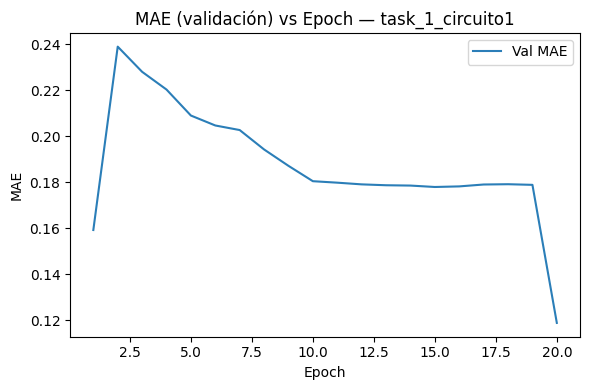

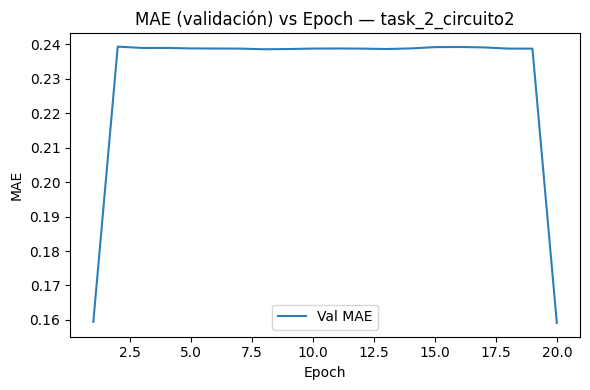

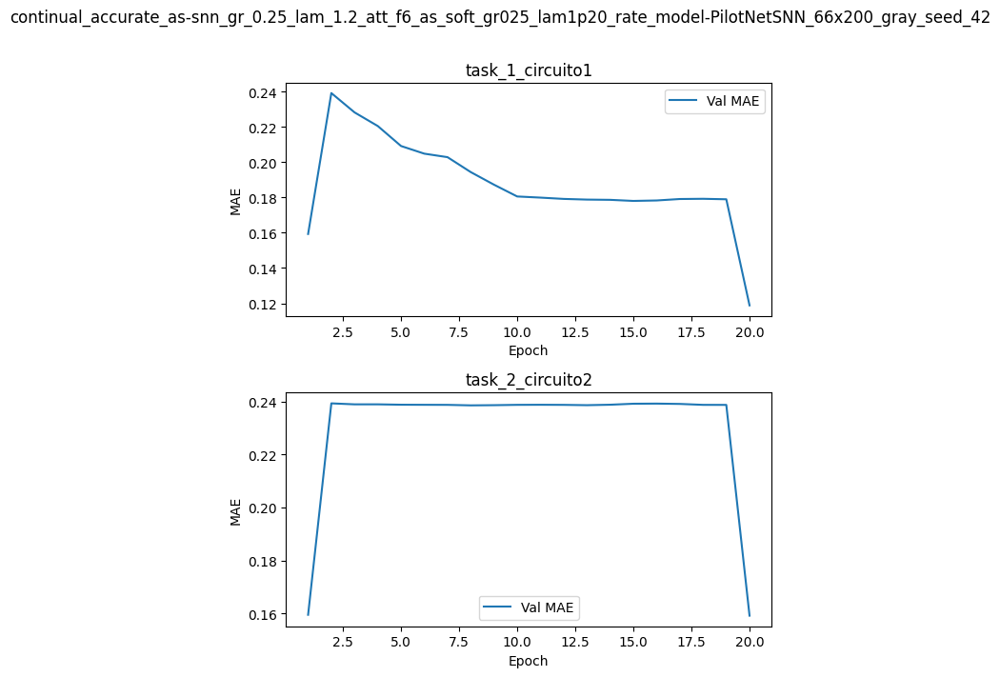

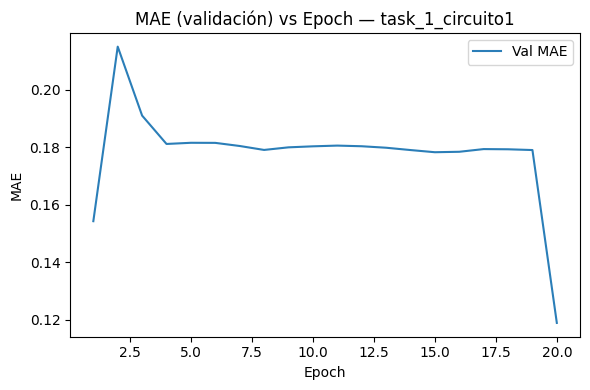

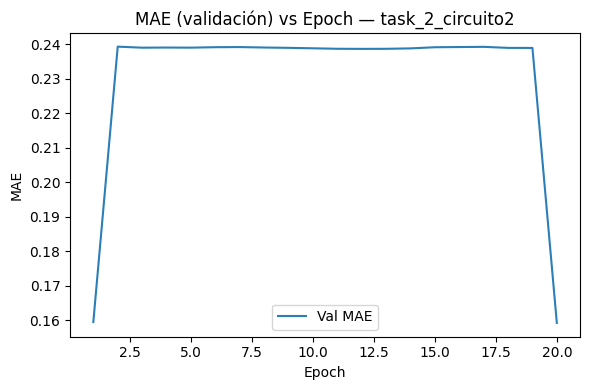

...

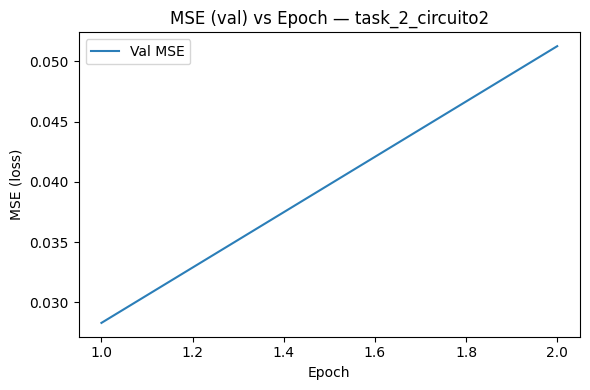

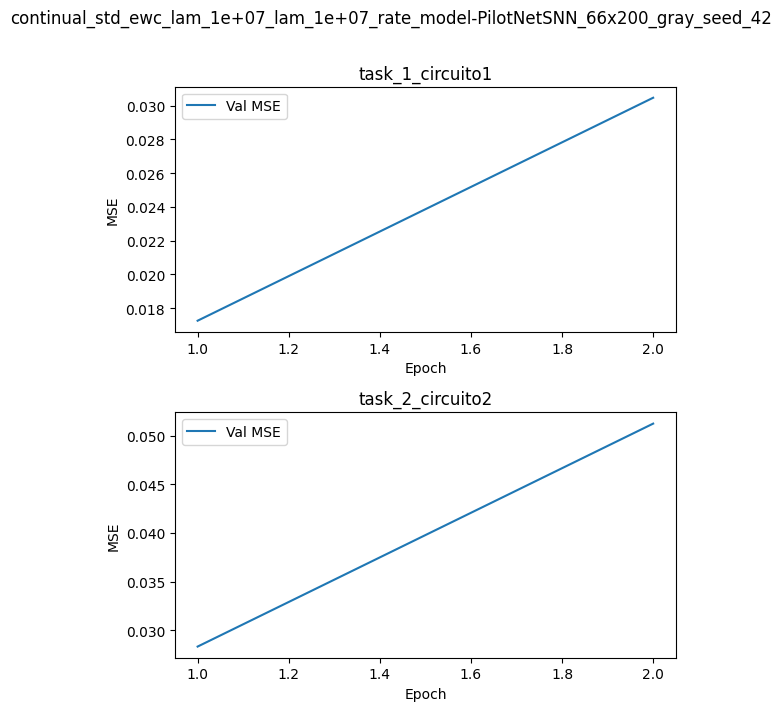

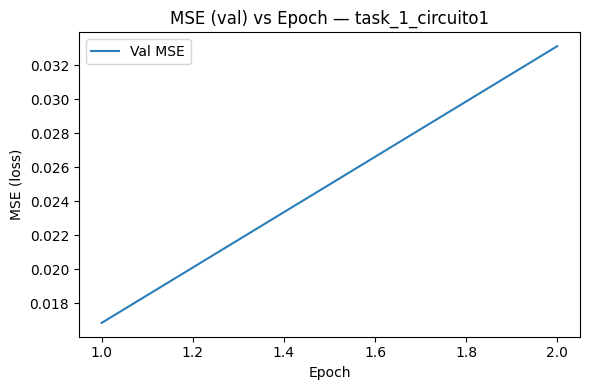

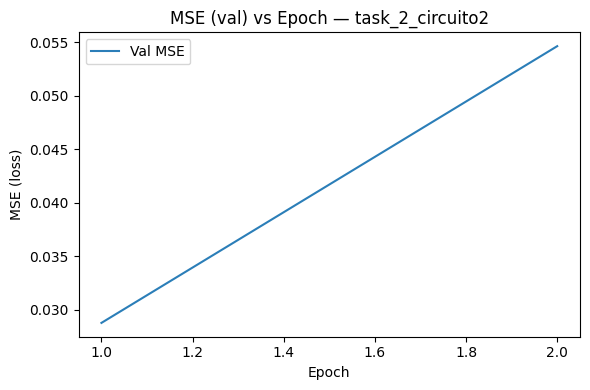

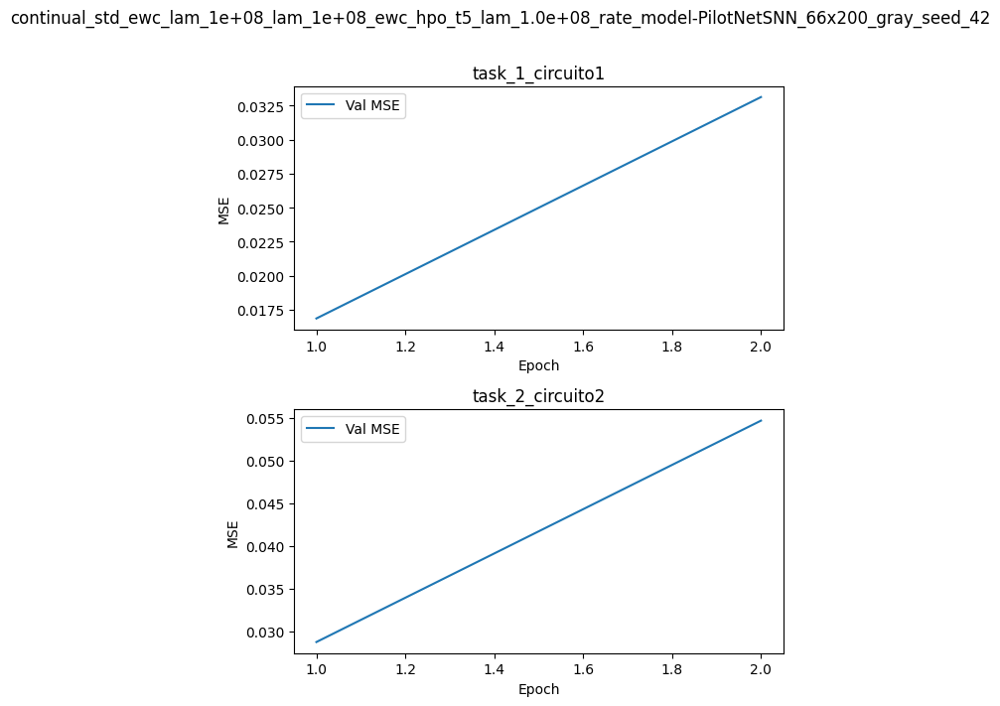

/home/cesar/proyectos/TFM_SNN/src/plots.py:352: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


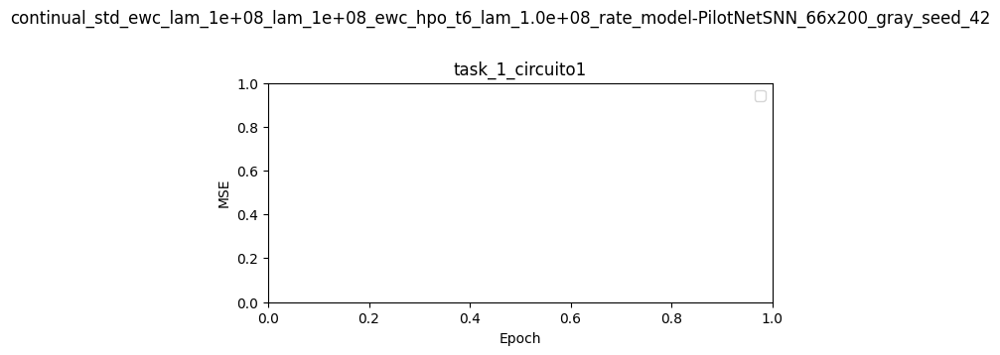

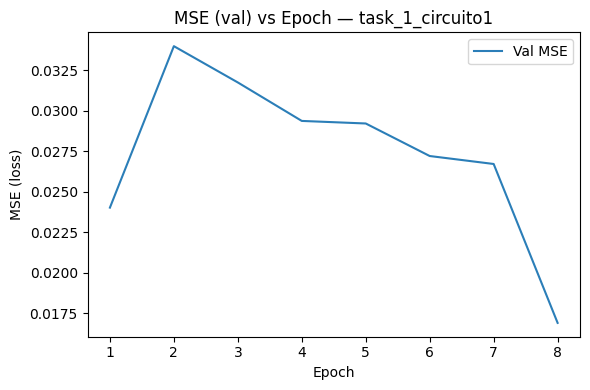

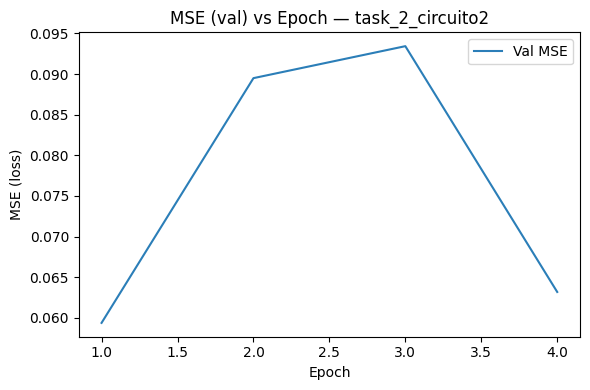

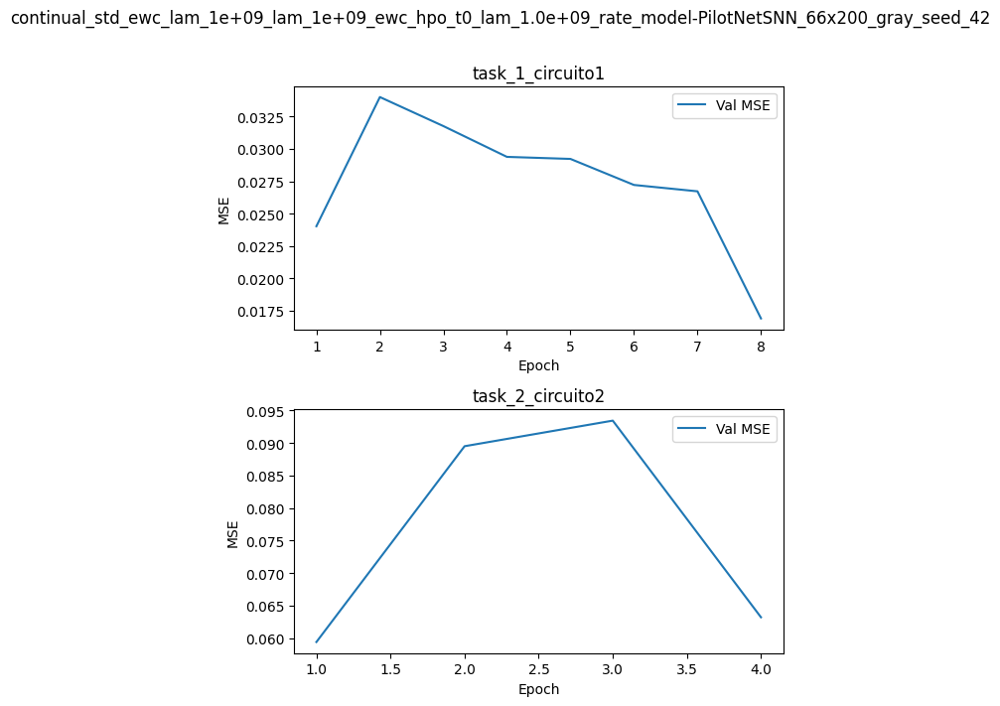

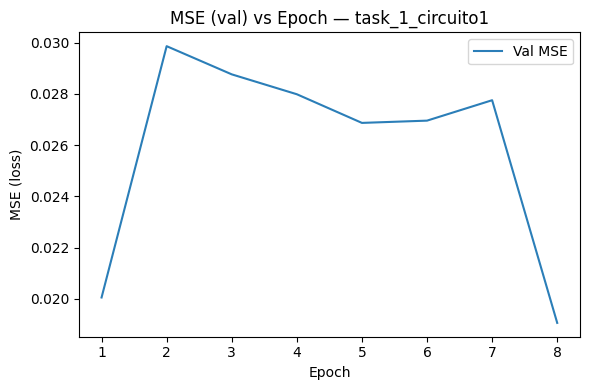

...

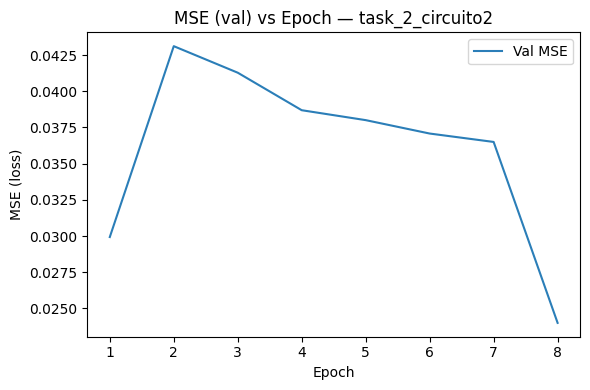

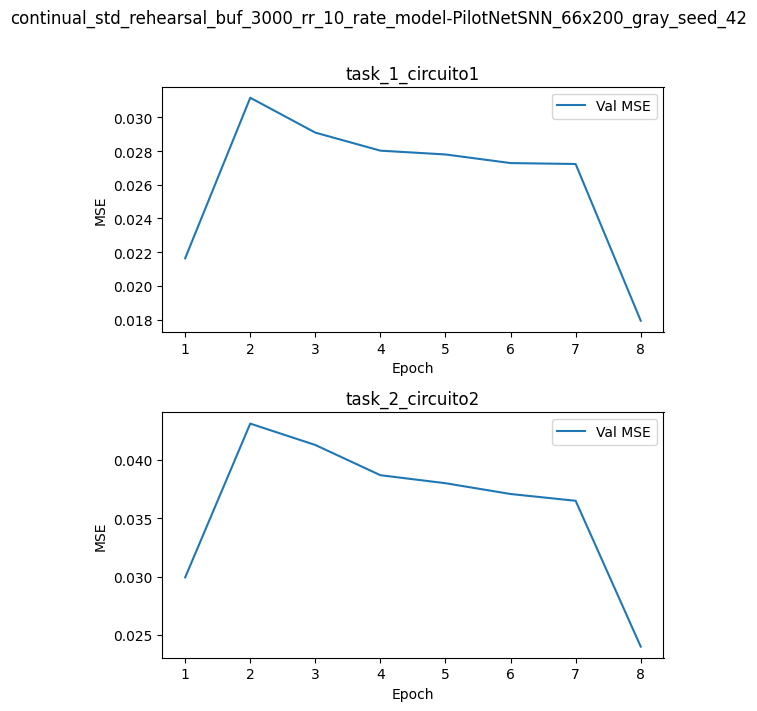

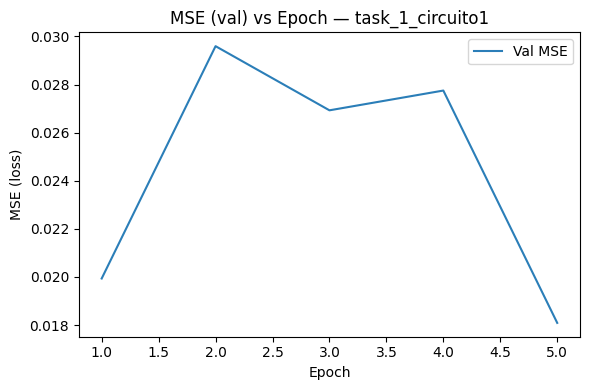

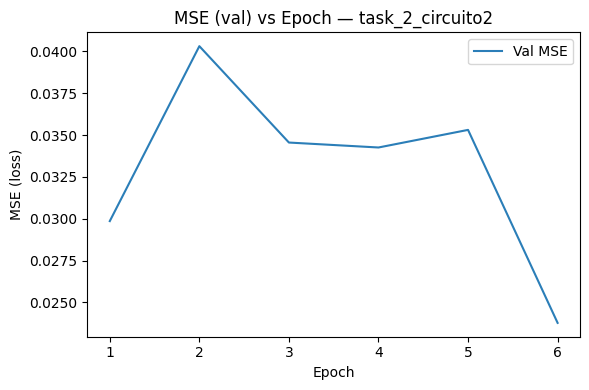

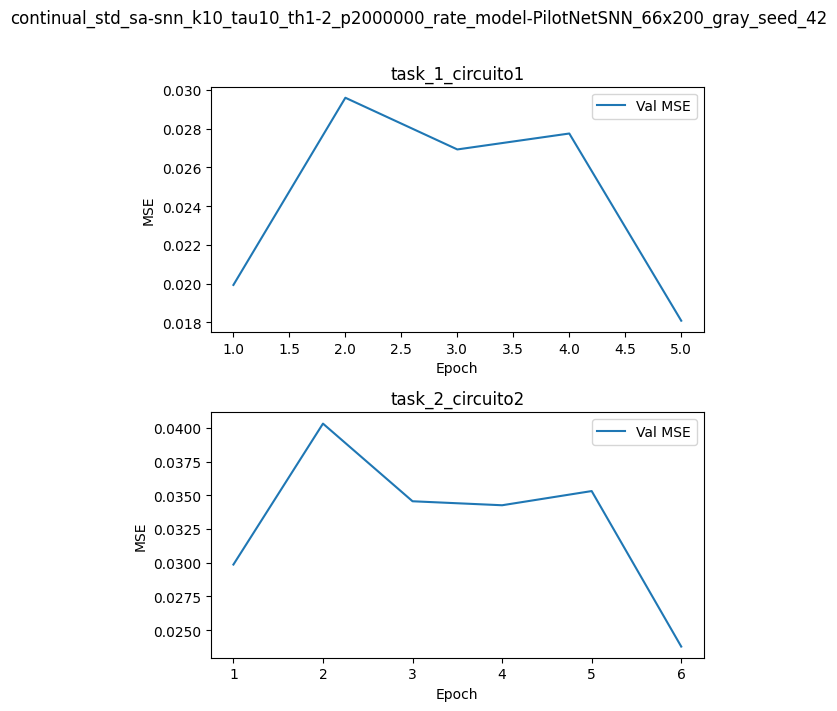

[OK] Curvas por run en: /home/cesar/proyectos/TFM_SNN/outputs/summary/plots_val_metrics


/home/cesar/proyectos/TFM_SNN/src/plots.py:35: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


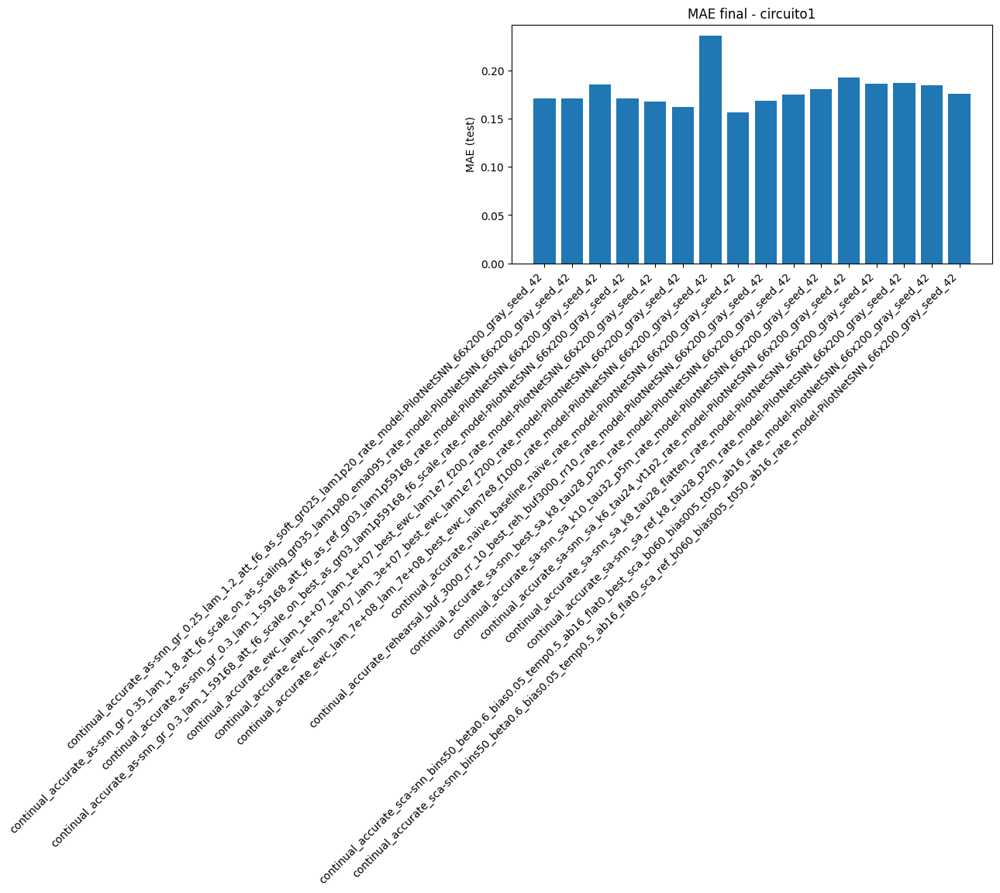

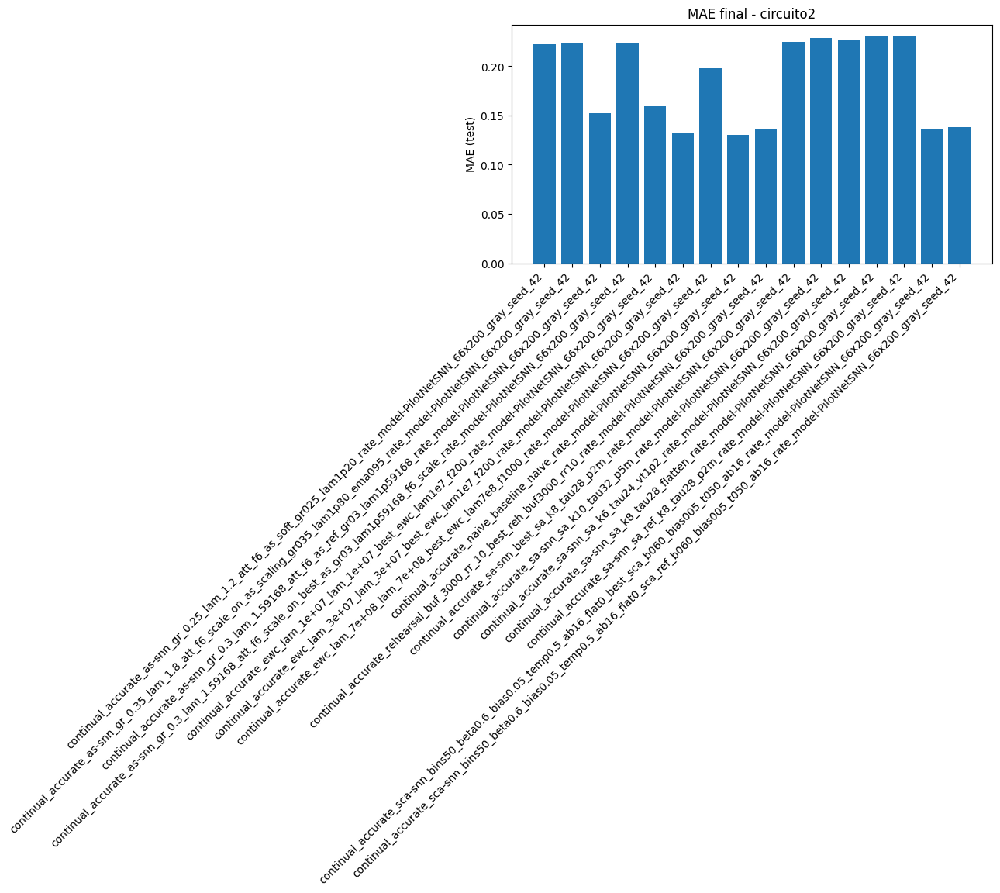

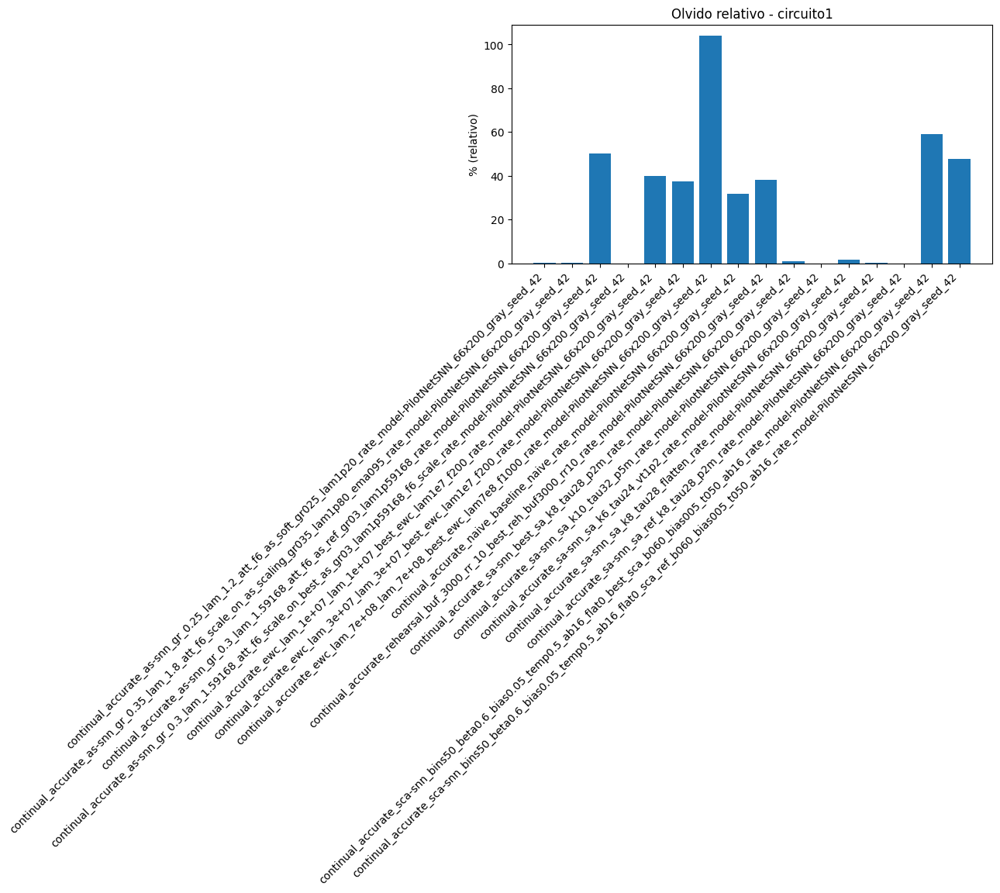

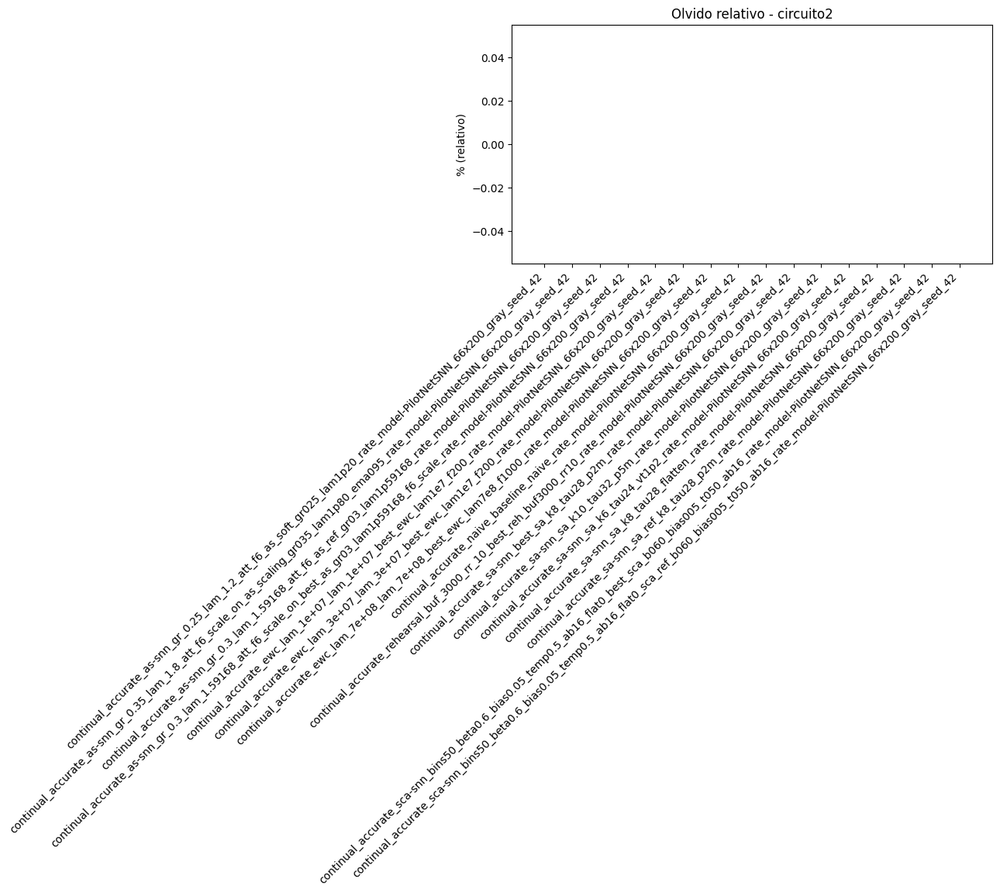

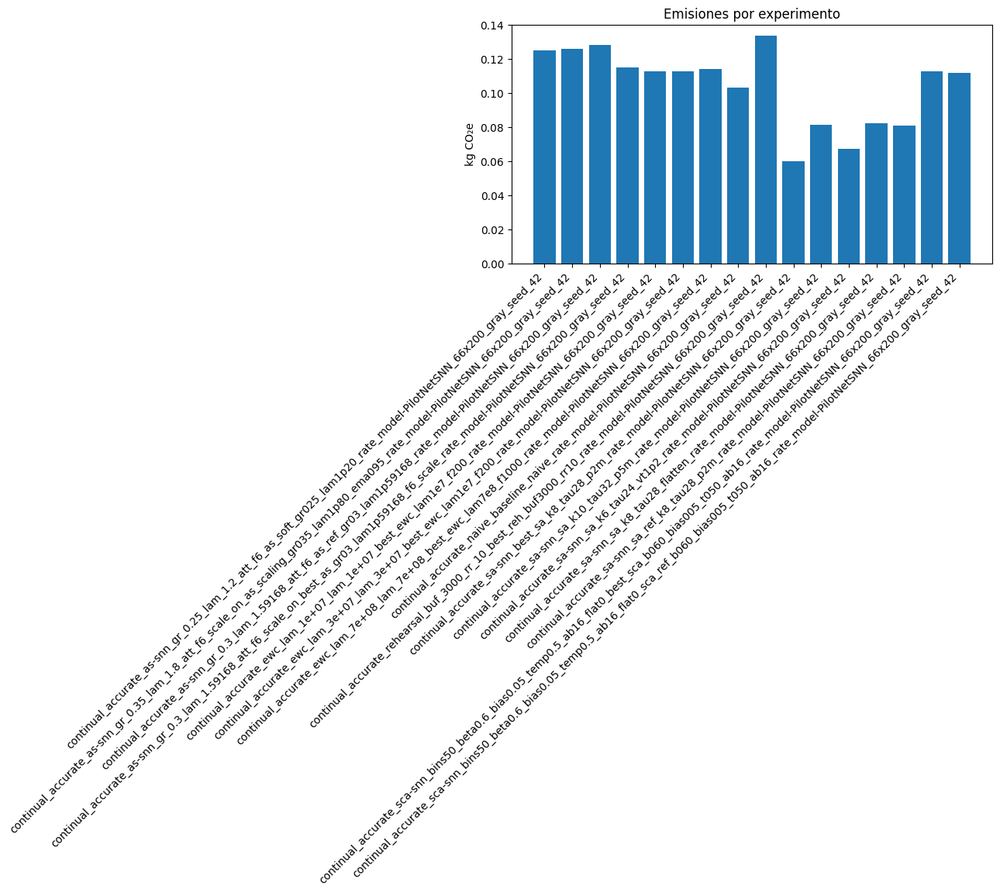

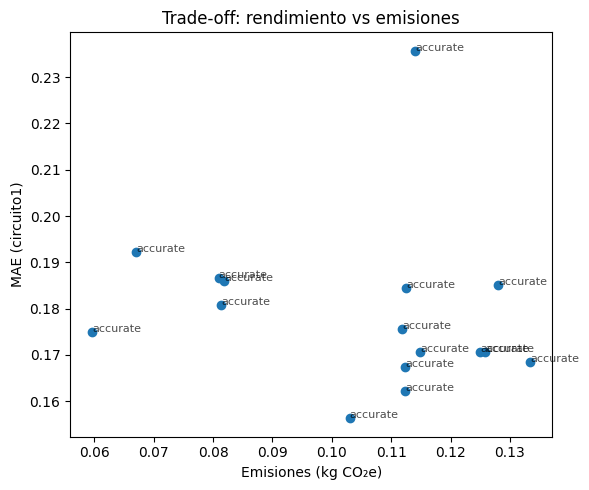

[OK] plot_across_runs → /home/cesar/proyectos/TFM_SNN/outputs/summary/plots_across_runs


In [10]:

# Curvas de validación por epoch para cada run (usa manifests del runner nuevo)
if plot_loss_curves_for_run is not None:
    base_plots = SUMMARY / "plots_val_metrics"
    base_plots.mkdir(parents=True, exist_ok=True)
    for rd in sorted((OUT).glob("continual_*")):
        try:
            plot_loss_curves_for_run(rd, base_plots, smooth_window=3)
        except Exception as e:
            print(f"[WARN] Falló curvas en {rd.name}: {e}")
    print("[OK] Curvas por run en:", base_plots)
else:
    print("[INFO] plot_mae_curves_for_run no disponible; saltando.")

# Barras y trade-offs “across runs”
if plot_across_runs is not None:
    dest_acc = SUMMARY / "plots_across_runs"
    dest_acc.mkdir(parents=True, exist_ok=True)
    try:
        plot_across_runs(df_acc, dest_acc)
        print("[OK] plot_across_runs →", dest_acc)
    except Exception as e:
        print("[WARN] plot_across_runs falló:", e)
else:
    print("[INFO] plot_across_runs no disponible; saltando.")


In [11]:
run = "continual_accurate_sca-snn_bins50_beta0.6_bias0.05_temp0.5_ab16_flat0_best_sca_b060_bias005_t050_ab16_rate_model-PilotNetSNN_66x200_gray_seed_42"
rd = OUT / run

print("Existe eval_matrix.json:", (rd/"eval_matrix.json").exists())
print("Existe per_task_perf.json:", (rd/"per_task_perf.json").exists(), " CSV:", (rd/"per_task_perf.csv").exists())

print("\nContenido breve eval_matrix.json:")
import json, itertools
if (rd/"eval_matrix.json").exists():
    j = json.loads((rd/"eval_matrix.json").read_text(encoding="utf-8"))
    print("tasks:", j.get("tasks"))
    M = j.get("mae_matrix")
    if M: 
        print("ultima columna:", [row[-1] if row else None for row in M])

print("\nper_task_perf.json (si hay):")
if (rd/"per_task_perf.json").exists():
    P = json.loads((rd/"per_task_perf.json").read_text(encoding="utf-8"))
    print(P)

print("\nper_task_perf.csv (si hay):")
import pandas as pd
if (rd/"per_task_perf.csv").exists():
    display(pd.read_csv(rd/"per_task_perf.csv"))


Existe eval_matrix.json: True
Existe per_task_perf.json: True  CSV: True

Contenido breve eval_matrix.json:
tasks: ['circuito1', 'circuito2']
ultima columna: [0.18454565644286516, 0.13551747311827958]

per_task_perf.json (si hay):
[{'task_idx': 1, 'task_name': 'circuito1', 'train_time_sec': 12763.891540527344, 'cuda_mem_peak_mb': 5494.1064453125, 'batch_size': 160, 'amp': True, 'encoder': 'rate', 'T': 30, 'epochs_done': 20, 'test_mae': 0.11604638114830747, 'final_mae': 0.18454565644286516}, {'task_idx': 2, 'task_name': 'circuito2', 'train_time_sec': 4270.028279304504, 'cuda_mem_peak_mb': 5494.888671875, 'batch_size': 160, 'amp': True, 'encoder': 'rate', 'T': 30, 'epochs_done': 20, 'test_mae': 0.13551747311827958, 'final_mae': 0.13551747311827958}]

per_task_perf.csv (si hay):


,task_idx,task_name,train_time_sec,cuda_mem_peak_mb,batch_size,amp,encoder,T,epochs_done,test_mae,final_mae
0,1,circuito1,12763.891541,5494.106445,160,True,rate,30,20,0.116046,0.184546
1,2,circuito2,4270.028279,5494.888672,160,True,rate,30,20,0.135517,0.135517
